1. <a href="L2D"> Modelo </a>

2. <a href="#caso1" >Caso 1</a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
%matplotlib inline

<a id="L2D"> </a>
 # COMCOT  lineal 2D


In [2]:
def simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx):
    dp1 = np.zeros_like(x)
    dp2 = np.zeros_like(x)
    dq1 = np.zeros_like(x)
    dq2 = np.zeros_like(x)

    zdepth = np.zeros_like(eta)
    zdepth[0,:,:] = eta[0,:,:]+h

    t0 = time.clock()
    for n in range(nt-1):


    #     eta[n+1,1:-1,1:-1] = eta[n,1:-1,1:-1] - rx*(p[n,1:-1,1:-1]-p[n,:-2,1:-1]) \
    #                                         -ry*(q[n,1:-1,1:-1]-q[n,1:-1,:-2])
    #     zdepth[n+1,1:-1,1:-1] = eta[n+1,1:-1,1:-1] + h[1:-1,1:-1]

    #     dp1 = 0.25*(zdepth[n+1,:,:]+zdepth[n,:,:]+zdepth[n+1,ip1,:]+zdepth[n,ip1,:])
    #     dp2 = 0.5*(zdepth[n+1,:,:]+zdepth[n+1,ip1,:])
    #     dq1 = 0.25*(zdepth[n+1,:,:]+zdepth[n,:,:]+zdepth[n+1,:,jp1]+zdepth[n,:,jp1])
    #     dq2 = 0.5*(zdepth[n+1,:,:]+zdepth[n+1,:,jp1])

        ## Mas Loop
        for i in range(1, nx-1):
            for j in range(1, ny-1):
                zzz = eta[n,i,j] - rx*(p[n,i,j]-p[n,i-1,j]) \
                               - ry*(q[n,i,j]-q[n,i,j-1])
                DD = zzz + h[i,j]
                zdepth[n+1,i,j] = DD
                eta[n+1,i,j] = zzz    


        # Calculate total water depth and total water depth a discharge point
        for i in range(nx):
            for j in range(ny):
                ip1 = min(nx-1,i+1)
                jp1 = min(ny-1,j+1)            
                im1 = max(0,i-1)
                jm1 = max(0,j-1)

                dp1[i,j] = 0.25*(zdepth[n+1,i,j] + zdepth[n,i,j] + zdepth[n+1,ip1,j] + zdepth[n, ip1, j])
                dp2[i,j] = 0.5*(zdepth[n+1,i,j]+zdepth[n+1,ip1,j])    
                dq1[i,j] = 0.25*(zdepth[n+1,i,j] + zdepth[n,i,j] + zdepth[n+1,i,jp1] + zdepth[n, i, jp1])
                dq2[i,j] = 0.5*(zdepth[n+1,i,j]+zdepth[n+1,i,jp1])    

        # open boundary
        i = 0
        for j in range(1,ny-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                if h[i,j-1]>gx:
                    uh = 0.5*(q[n,i,j]+q[n,i,j-1])
                else:
                    uh = q[n,i,j]
                uu = np.sqrt(uh**2+p[n,i,j]**2)
                zz = uu/cc
                if p[n,i,j]>0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]

        i = nx-1
        for j in range(1,ny-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i,j-1])
                uu = np.sqrt(uh**2+p[n,i-1,j]**2)
                zz = uu/cc
                if p[n,i-1,j]<0:
                    zz = -zz
                eta[n+1,i,j] = zz     
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]

        j = 0
        for i in range(1,nx-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i-1,j])
                uu = np.sqrt(uh**2+q[n,i,j]**2)
                zz = uu/cc
                if q[n,i,j]>0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]        

        j = ny-1
        for i in range(1,nx-1):
            if h[i,j]>gx:
                cc = np.sqrt(9.81*h[i,j])
                uh = 0.5*(p[n,i,j]+p[n,i-1,j])
                uu = np.sqrt(uh**2+q[n,i,j]**2)
                zz = uu/cc
                if q[n,i-1,j]<0:
                    zz = -zz
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j]
            else:
                zz = 0.0
                eta[n+1,i,j] = zz
                zdepth[n+1,i,j] = zz+h[i,j] 

        i = 0
        j = 0
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i,j]
            qy = q[n,i,j]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx>0 or qy>0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]           

        i = nx-1
        j = 0
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i-1,j]
            qy = q[n,i,j]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx<0 or qy>0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]                 

        i = 0
        j = ny-1
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i,j]
            qy = q[n,i,j-1]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx>0 or qy<0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]

        i = nx-1
        j = ny-1
        if h[i,j]>gx:
            cc = np.sqrt(9.81*h[i,j])
            qx = p[n,i-1,j]
            qy = q[n,i,j-1]
            uu = np.sqrt(qx**2+qy**2)        
            zz = uu/cc
            if qx<0 or qy<0:
                zz = -zz
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]
        else:
            zz = 0.0
            eta[n+1,i,j] = zz
            zdepth[n+1,i,j] = zz+h[i,j]               

        # momentum loop

        # momentum in x-direction
        for i in range(1,nx-1):
            for j in range(1,ny-1):
                noflux = False
                #moving boundary
                ip1 = min(nx-1,i+1)
                jp1 = min(ny-1,j+1)
                im1 = max(0,i-1)
                jm1 = max(0,j-1)

                if (zdepth[n+1,i,j]>gx and zdepth[n+1,ip1,j]>gx):
                    dd = dp2[i,j]
                    df = dp1[i,j]
                elif (zdepth[n+1,i,j]>gx and zdepth[n+1,ip1,j]<=gx \
                     and h[ip1,j]+eta[n+1,i,j]>0):
#                     dd = h[ip1,j] + eta[n+1,i,j]
#                     df = dd
                    dd = 0.5*zdepth[n+1,i,j]
                elif (zdepth[n+1,i,j]<=gx and zdepth[n+1,ip1,j]>gx \
                     and h[i,j]+eta[n+1,ip1,j]>0):
                    dd = zdepth[n+1,ip1,j]
#                     dd = h[i,j] + eta[n+1,ip1,j]
#                     df = dd
                else:
                    p[n+1,i,j] = 0.0
                    noflux = True

                #upwind scheme for x direction
                advx = 0.0
                if not noflux:
                    p[n+1,i,j] = p[n,i,j] - 9.81*rx*dd*(eta[n+1,i+1,j]-eta[n+1,i,j]) - \
                             9.81*rx*dd/12.*((eta[n+1,ip1,jp1]-2.*eta[n+1,ip1,j]+eta[n+1,ip1,jm1]) -
                                             (eta[n+1,i,jp1] -2.*eta[n+1,i,j] + eta[n+1,i,jm1]))
                else:
                    p[n+1,i,j] = 0.0


        # momentum in y-direction
        for i in range(1,nx-1):
            for j in range(1,ny-1):
                noflux = False
                #moving boundary
                ip1 = min(nx-1,i+1)
                jp1 = min(ny-1,j+1)
                im1 = max(0,i-1)
                jm1 = max(0,j-1)

                if (zdepth[n+1,i,j]>gx and zdepth[n+1,i,jp1]>gx):
                    dd = dq2[i,j]
                    df = dq1[i,j]
                elif (zdepth[n+1,i,j]>gx and zdepth[n+1,i,jp1]<=gx \
                     and h[i,jp1]+eta[n+1,i,j]>gx):
                    dd = 0.5*zdepth[n+1,i,j]
#                     dd = h[i,jp1] + eta[n+1,i,j]
#                     df = dd
                elif (zdepth[n+1,i,j]<=gx and zdepth[n+1,i,jp1]>gx \
                     and h[i,j]+eta[n+1,i,jp1]>gx):
                    dd = 0.5*zdepth[n+1,i,jp1]
#                     dd = h[i,j] + eta[n+1,i,jp1]
#                     df = dd
                else:
                    q[n+1,i,j] = 0.0
                    noflux = True

                #upwind scheme for x direction
                advy = 0.0
                if not noflux:
                    q[n+1,i,j] = q[n,i,j] - 9.81*ry*dd*(eta[n+1,i,jp1]-eta[n+1,i,j]) - \
                                9.81*ry*dd/12.*((eta[n+1,ip1,jp1]-2*eta[n+1,i,jp1]+eta[n+1,im1,jp1]) - \
                                               (eta[n+1,ip1,j]-2*eta[n+1,i,j]+eta[n+1,im1,j]))           
                else:
                    q[n+1,i,j] = 0.0    
    
        t1 = time.clock()    
        print n*1.0/nt, 'elapsed: %.3f s, estimated %.3f s:'%(t1-t0,(t1-t0)*nt*1.0/(n+1))
    return eta,p,q

<a id="caso1"></a>
# Caso de prueba

In [3]:
nt = 400
ny = 100
nx = 100
y = np.linspace(-200,200,ny)
x = np.linspace(-200,200,nx)
x,y = np.meshgrid(x,y,indexing='ij')
h = np.ones_like(x)*5.
h = np.where(np.abs(x**2+y**2)<=30**2,1.0,h)
# h = np.where(x>=90,-2,h)
# h = np.where(y<=-90,-2,h)
# h = np.where(y>=90,-2,h)

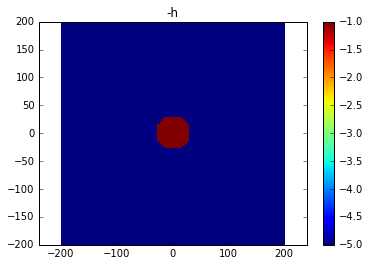

In [4]:
plt.pcolormesh(x,y,-h)
plt.axis('equal')
plt.title('-h')
plt.colorbar()

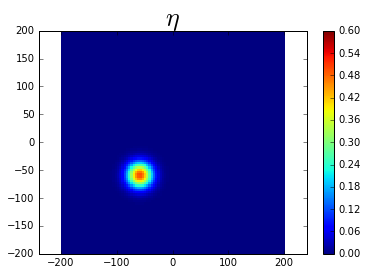

In [5]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = 00.5*np.exp(-((y+60)**2+(x+60)**2)/500) ##gaussian bell
eta[0,:,:] = np.where(h>=0,eta[0,:,:],-h)
plt.pcolormesh(x,y,eta[0,:,:],vmax=0.6)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()

In [6]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))

In [7]:
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-5
grx = 9.81*dt/dx
gry = 9.81*dt/dy

In [8]:
print 'finished'

finished


In [9]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)

0.0 elapsed: 0.248 s, estimated 99.223 s:
0.0025 elapsed: 0.428 s, estimated 85.585 s:
0.005 elapsed: 0.612 s, estimated 81.665 s:
0.0075 elapsed: 0.812 s, estimated 81.206 s:
0.01 elapsed: 1.000 s, estimated 79.992 s:
0.0125 elapsed: 1.188 s, estimated 79.215 s:
0.015 elapsed: 1.377 s, estimated 78.672 s:
0.0175 elapsed: 1.572 s, estimated 78.583 s:
0.02 elapsed: 1.783 s, estimated 79.256 s:
0.0225 elapsed: 1.973 s, estimated 78.931 s:
0.025 elapsed: 2.184 s, estimated 79.431 s:
0.0275 elapsed: 2.370 s, estimated 78.996 s:
0.03 elapsed: 2.600 s, estimated 79.989 s:
0.0325 elapsed: 2.878 s, estimated 82.219 s:
0.035 elapsed: 3.066 s, estimated 81.762 s:
0.0375 elapsed: 3.285 s, estimated 82.129 s:
0.04 elapsed: 3.470 s, estimated 81.637 s:
0.0425 elapsed: 3.677 s, estimated 81.711 s:
0.045 elapsed: 3.887 s, estimated 81.839 s:
0.0475 elapsed: 4.073 s, estimated 81.460 s:
0.05 elapsed: 4.278 s, estimated 81.488 s:
0.0525 elapsed: 4.473 s, estimated 81.331 s:
0.055 elapsed: 4.666 s, esti


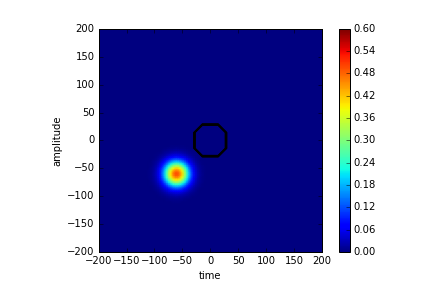
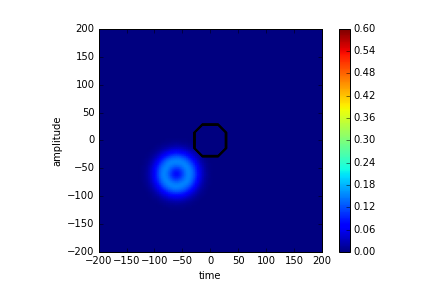
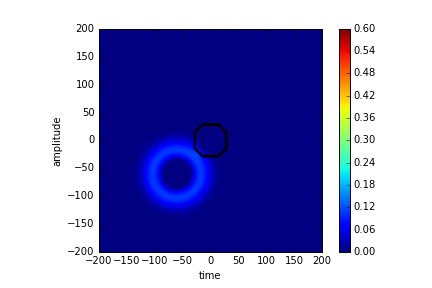
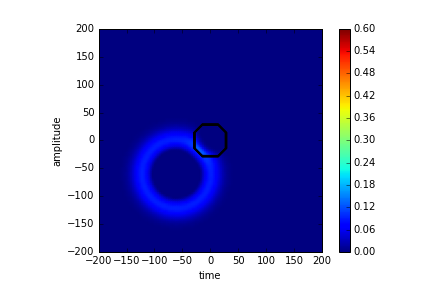
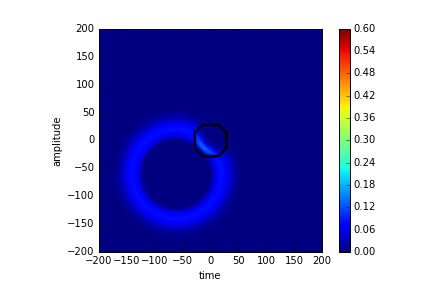
...
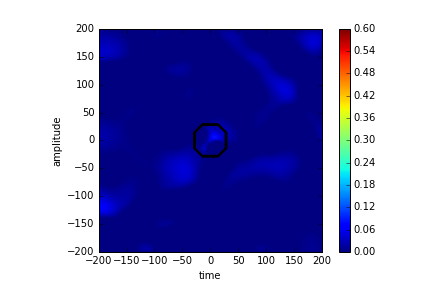
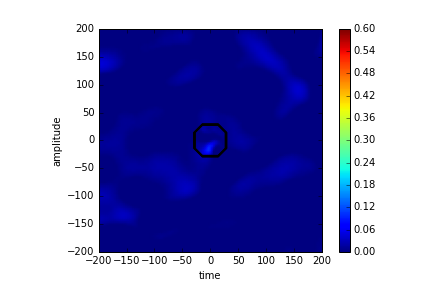
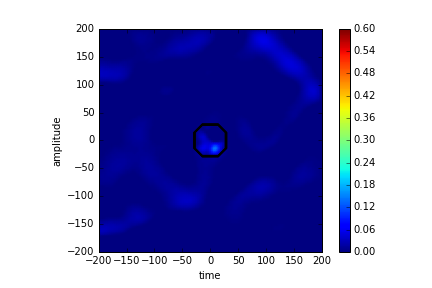
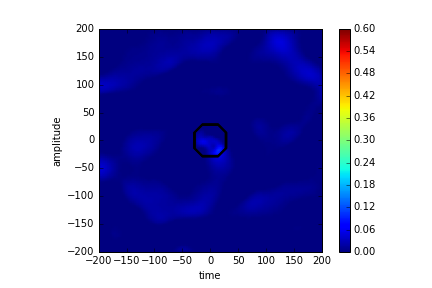
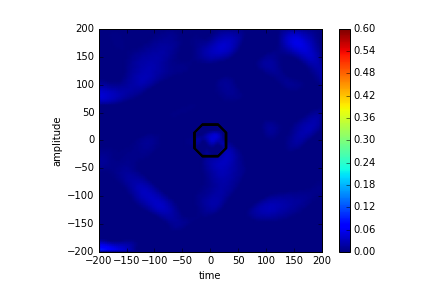

In [10]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmax=0.6)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*10,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=40, interval=100)

<a id="caso2"></a>

# [Caso 2: Isla cónica](http://nctr.pmel.noaa.gov/benchmark/Laboratory/Laboratory_ConicalIsland/index.html)

In [11]:
def topo(x,y):
    """
    Conical island
    """
    # Depth of water: 0.32 or 0.42 meters for benchmarks.
    depth = 0.32
    r = np.sqrt(x**2 + y**2) 
    z = np.where(r < 1.1, 0.625, 0.625 - 0.25*(r-1.1))
    z = np.where(r < 3.6, z, 0.)
    z = z - depth
    return z

In [12]:
def qinit(x,y):
    """
    Wave approaching from left.
    (Used as initial test problem)
    """
    hjump = 0.3
#     z = np.where((x > -9.) & (x < -7.), hjump, 0.)
    z = 0.01*np.exp(-(x+8)**2)
    return z

In [83]:
nt = 50
ny = 100*3
nx = 125*3
y = np.linspace(-15,15,ny)
x = np.linspace(-22.5,15,nx)
x,y = np.meshgrid(x,y,indexing='ij')
h = -topo(x,y)

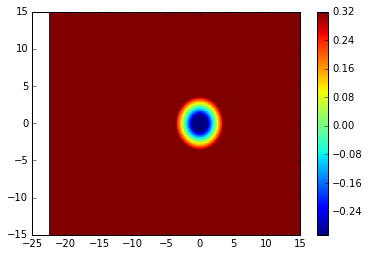

In [84]:
plt.pcolormesh(x,y,h)
plt.colorbar()

In [85]:
5/4000.

0.00125

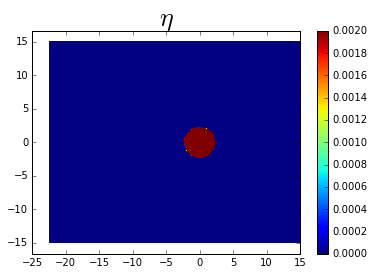

In [86]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = 0.00*np.exp(-(x+10)**2/4) ##gaussian bell
eta[0,:,:] = np.where(h>=0,eta[0,:,:],-h)
plt.pcolormesh(x,y,eta[0,:,:],vmax=0.002)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure(figsize=(9,6))
ax = fig.gca(projection='3d')
surf = ax.plot_surface(x,y,-h, rstride=1, cstride=1, cmap=cm.Greens_r,
                       linewidth=0.0, antialiased=False)
surf2 = ax.plot_surface(x,y,eta[0,:,:], rstride=1, cstride=1, cmap=cm.Blues_r,
                       linewidth=0.)
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.set_axis_off()
ax.azim = -100.
ax.elev = 15

In [88]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-5
grx = 9.81*dt/dx
gry = 9.81*dt/dy

In [89]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)
print 'finished!'

0.0 elapsed: 2.461 s, estimated 123.045 s:
0.02 elapsed: 4.842 s, estimated 121.061 s:
0.04 elapsed: 7.320 s, estimated 122.002 s:
0.06 elapsed: 9.619 s, estimated 120.237 s:
0.08 elapsed: 11.924 s, estimated 119.244 s:
0.1 elapsed: 14.329 s, estimated 119.405 s:
0.12 elapsed: 16.645 s, estimated 118.894 s:
0.14 elapsed: 18.925 s, estimated 118.284 s:
0.16 elapsed: 21.241 s, estimated 118.006 s:
0.18 elapsed: 23.590 s, estimated 117.951 s:
0.2 elapsed: 25.899 s, estimated 117.724 s:
0.22 elapsed: 28.316 s, estimated 117.983 s:
0.24 elapsed: 31.059 s, estimated 119.459 s:
0.26 elapsed: 33.577 s, estimated 119.918 s:
0.28 elapsed: 35.966 s, estimated 119.885 s:
0.3 elapsed: 38.294 s, estimated 119.670 s:
0.32 elapsed: 40.741 s, estimated 119.825 s:
0.34 elapsed: 43.053 s, estimated 119.592 s:
0.36 elapsed: 45.337 s, estimated 119.308 s:
0.38 elapsed: 47.612 s, estimated 119.029 s:
0.4 elapsed: 49.856 s, estimated 118.705 s:
0.42 elapsed: 52.261 s, estimated 118.775 s:
0.44 elapsed: 54.67


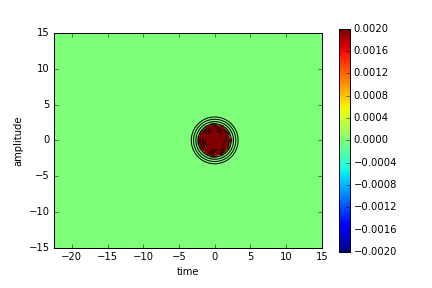
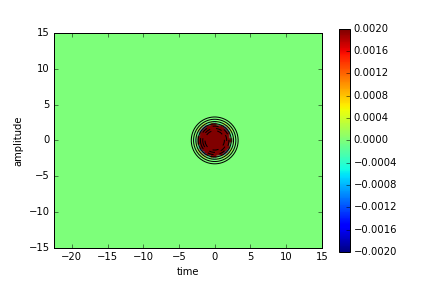
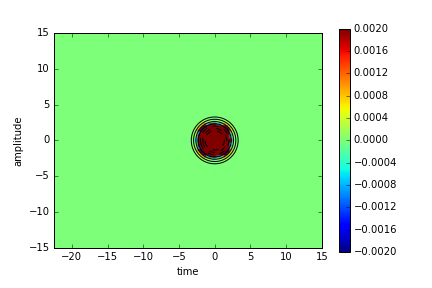
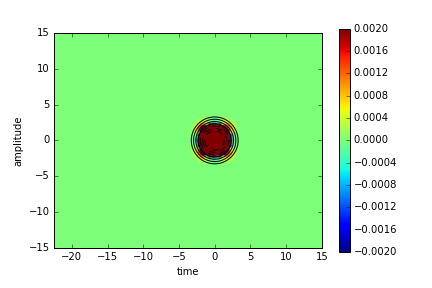
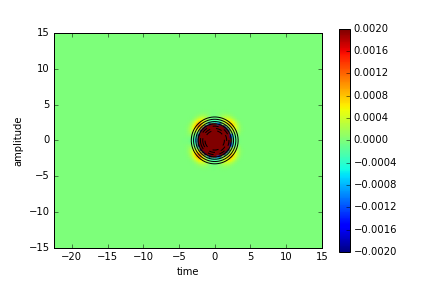
...
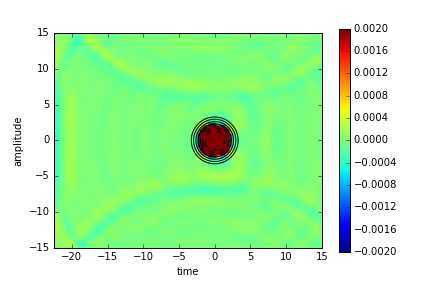
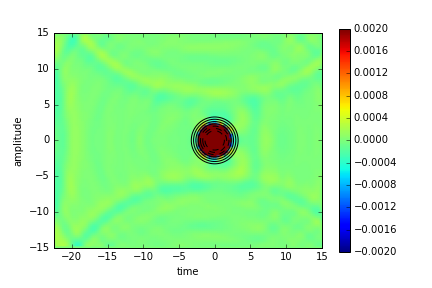
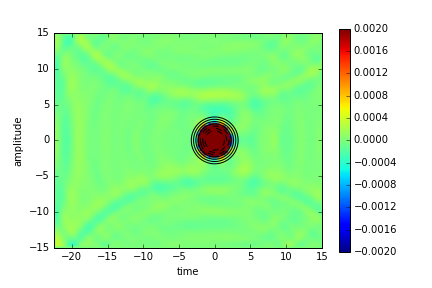
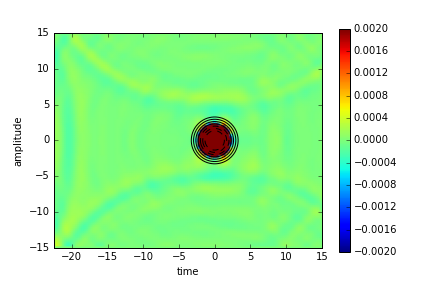
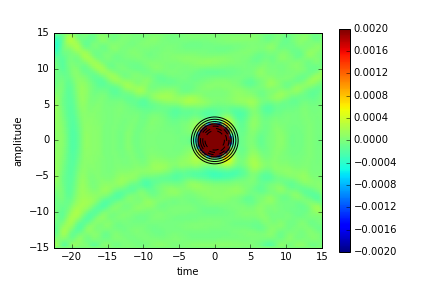

In [20]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmin=-0.002,vmax=0.002)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
# ax2.set_xlim(-10,5)
# ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*4,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=50, interval=100)


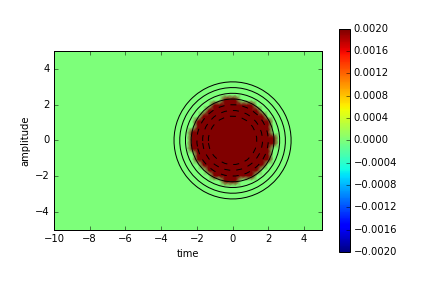
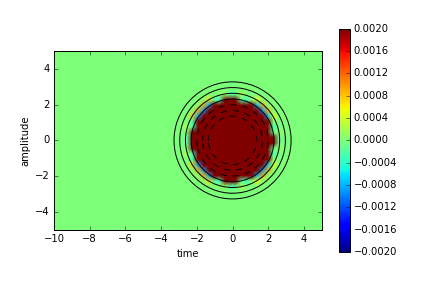
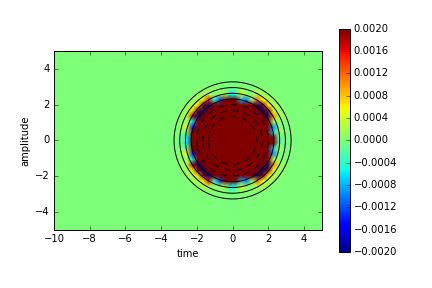
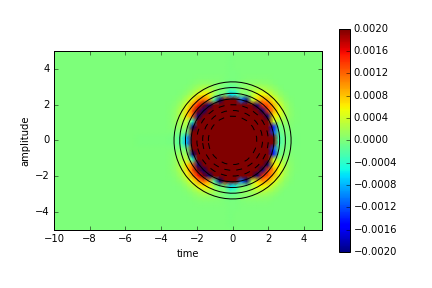
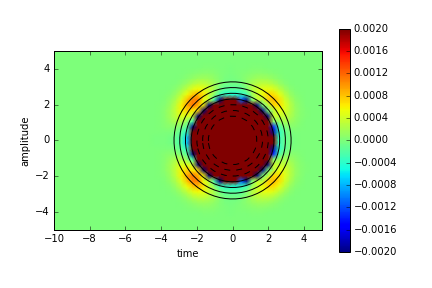
...
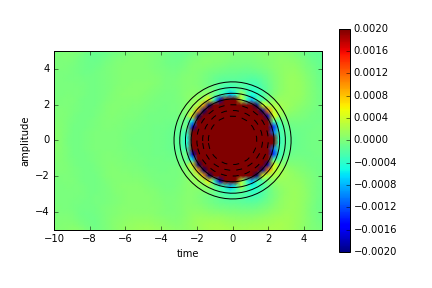
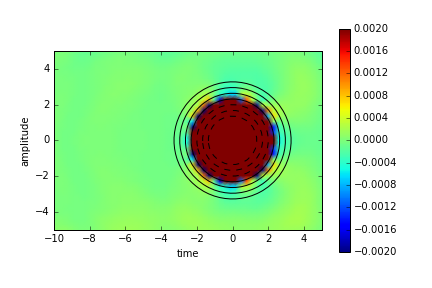
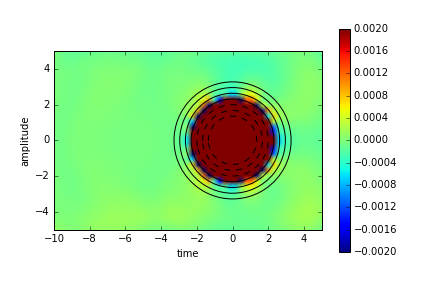
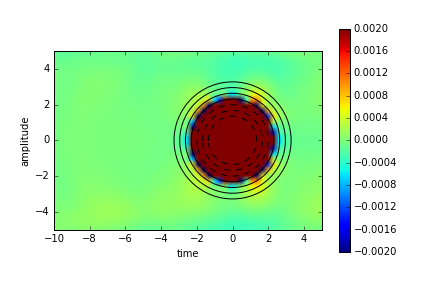
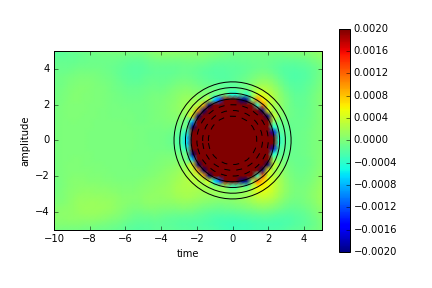

In [21]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure()
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmin=-0.002,vmax=0.002)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
ax2.set_xlim(-10,5)
ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*4,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=50, interval=100)

Falla el borde $j=ny$ y $i=0$

# Caso 3: Tsunami Chile 2010

In [22]:
from scipy.io import loadmat

In [37]:
h = loadmat('MorenoCS_h')
falla = loadmat('MorenoCS_z')

In [38]:
xb = h['xh'][0,0][0,:]
yb = h['yh'][0,0][0,:]
zb = h['zh'][0,0]
zf = falla['zf'][0,0]
xf = falla['xf'][0,0][0,:]
yf = falla['yf'][0,0][0,:]

(72,) (99,) (99, 72)


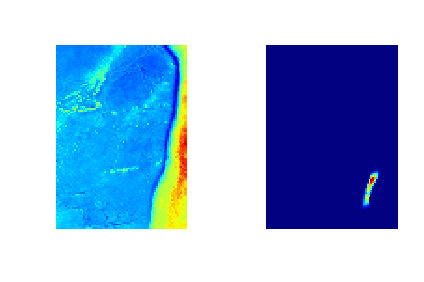

In [39]:
# plt.figure(figsize=(9,9))
r = 6
print xb[::r].shape,yb[::r].shape,zb[::r,::r].shape
plt.subplot(121)
plt.pcolormesh(xb[::r],yb[::r],zb[::r,::r],vmin=-8000,vmax=6000)
plt.axis('equal')
plt.axis('off')
plt.subplot(122)
plt.pcolormesh(xf[::r],yf[::r],zf[::r,::r],vmin=0.0)
plt.axis('off')
plt.axis('equal')
plt.tight_layout()

144 198


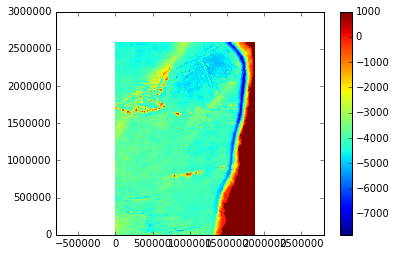

In [70]:
r = 3
nt = 50
x = xb[::r] - xb.min()
y = yb[::r] - yb.min()
x,y = np.meshgrid(x,y,indexing='ij')
h = -zb[::r,::r].T
h = np.where(h<0,-1000,h)

nx,ny = x.shape
plt.pcolormesh(x,y,-h)
plt.axis('equal')
plt.colorbar()
print nx,ny

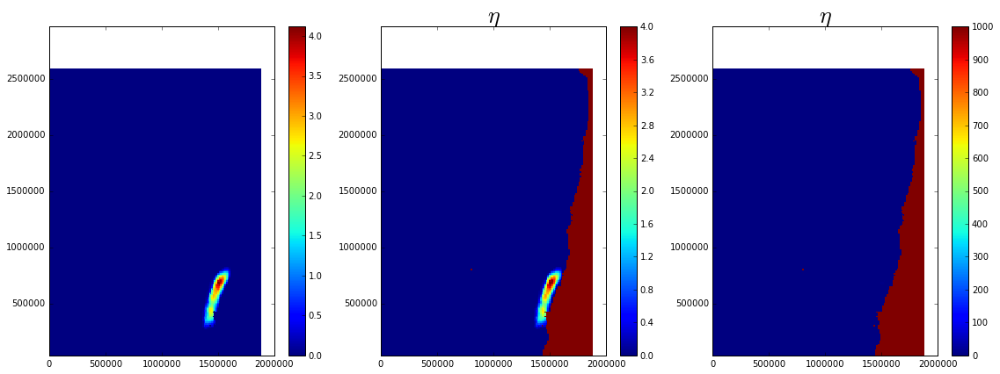

In [71]:
eta = np.zeros((nt,nx,ny))
eta[0,:,:] = zf[::r,::r].T
eta[0,:,:] = np.where(eta[0,:,:]<0,0.0,eta[0,:,:])
eta[0,:,:] = np.where(h>gx,eta[0,:,:],-h)

plt.figure(figsize=(16,6))
plt.subplot(131)
plt.pcolormesh(x,y,zf[::r,::r].T,vmin=0.0)
plt.colorbar()
plt.axis('equal')
plt.subplot(132)
plt.pcolormesh(x,y,eta[0,:,:],vmax=4)
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()
plt.subplot(133)
plt.pcolormesh(x,y,eta[0,:,:])
plt.axis('equal')
plt.title(u'$\eta$',fontsize=26)
plt.colorbar()
plt.tight_layout()

In [72]:
p = np.zeros((nt,nx,ny))
q = np.zeros((nt,nx,ny))
cfl = 0.45
dx = np.diff(x.T)[0,0]
dy = np.diff(y)[0,0]
dt = cfl*min(dx,dy)/np.sqrt(np.max(h)*9.81)
rx = dt/dx
ry = dt/dy
gx = 1e-2
grx = 9.81*dt/dx
gry = 9.81*dt/dy

In [73]:
np.max(h)

7826.8102311375733

In [74]:
eta,p,q = simulation(x,h,eta,p,q,rx,ry,dx,dy,cfl,nt,gx)
print 'finished!'

0.0 elapsed: 0.593 s, estimated 29.669 s:
0.02 elapsed: 1.219 s, estimated 30.463 s:
0.04 elapsed: 1.843 s, estimated 30.717 s:
0.06 elapsed: 2.424 s, estimated 30.304 s:
0.08 elapsed: 3.000 s, estimated 30.004 s:
0.1 elapsed: 3.581 s, estimated 29.846 s:
0.12 elapsed: 4.155 s, estimated 29.678 s:
0.14 elapsed: 4.752 s, estimated 29.701 s:
0.16 elapsed: 5.326 s, estimated 29.591 s:
0.18 elapsed: 5.920 s, estimated 29.601 s:
0.2 elapsed: 6.493 s, estimated 29.512 s:
0.22 elapsed: 7.074 s, estimated 29.475 s:
0.24 elapsed: 7.689 s, estimated 29.574 s:
0.26 elapsed: 8.262 s, estimated 29.507 s:
0.28 elapsed: 8.986 s, estimated 29.953 s:
0.3 elapsed: 9.590 s, estimated 29.969 s:
0.32 elapsed: 10.186 s, estimated 29.959 s:
0.34 elapsed: 10.829 s, estimated 30.080 s:
0.36 elapsed: 11.401 s, estimated 30.003 s:
0.38 elapsed: 11.963 s, estimated 29.907 s:
0.4 elapsed: 12.524 s, estimated 29.819 s:
0.42 elapsed: 13.130 s, estimated 29.841 s:
0.44 elapsed: 13.690 s, estimated 29.760 s:
0.46 elap


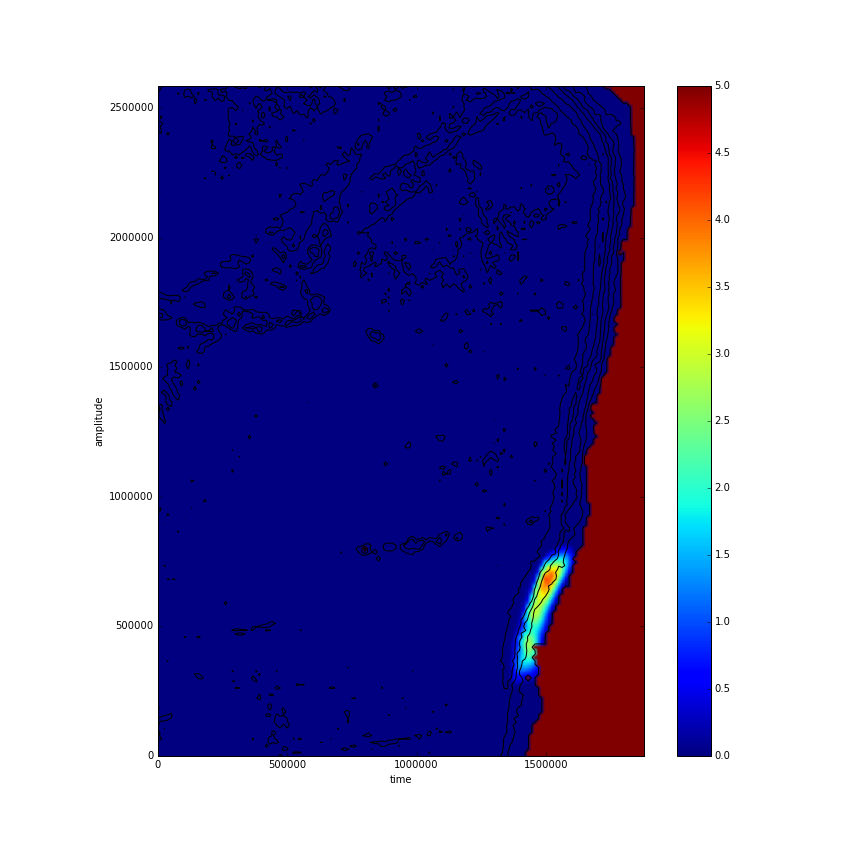
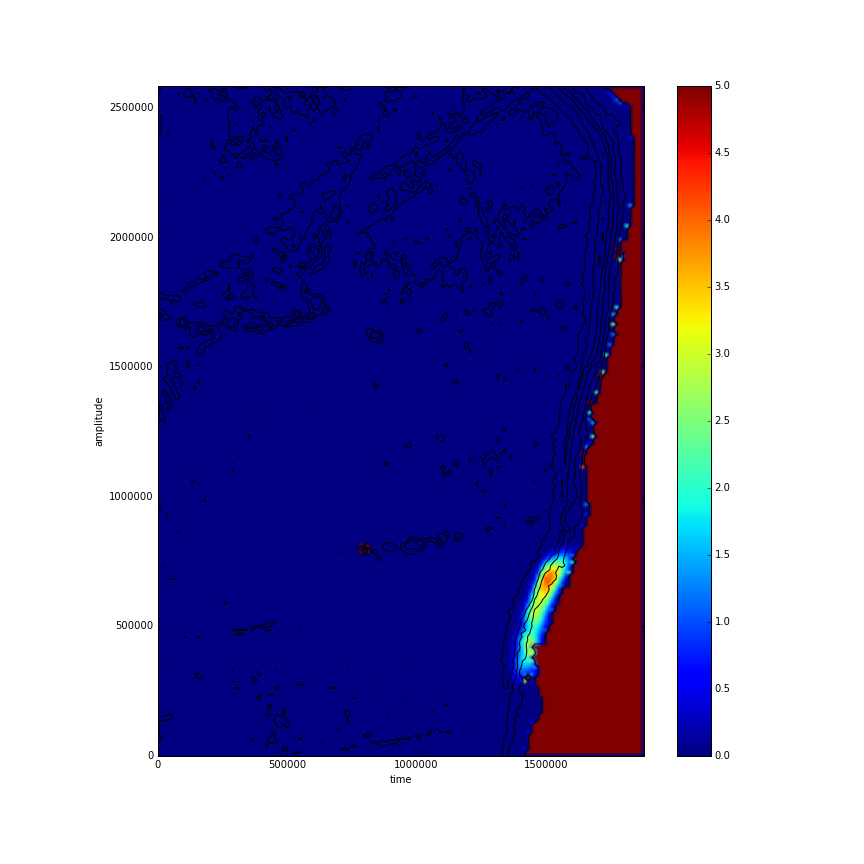
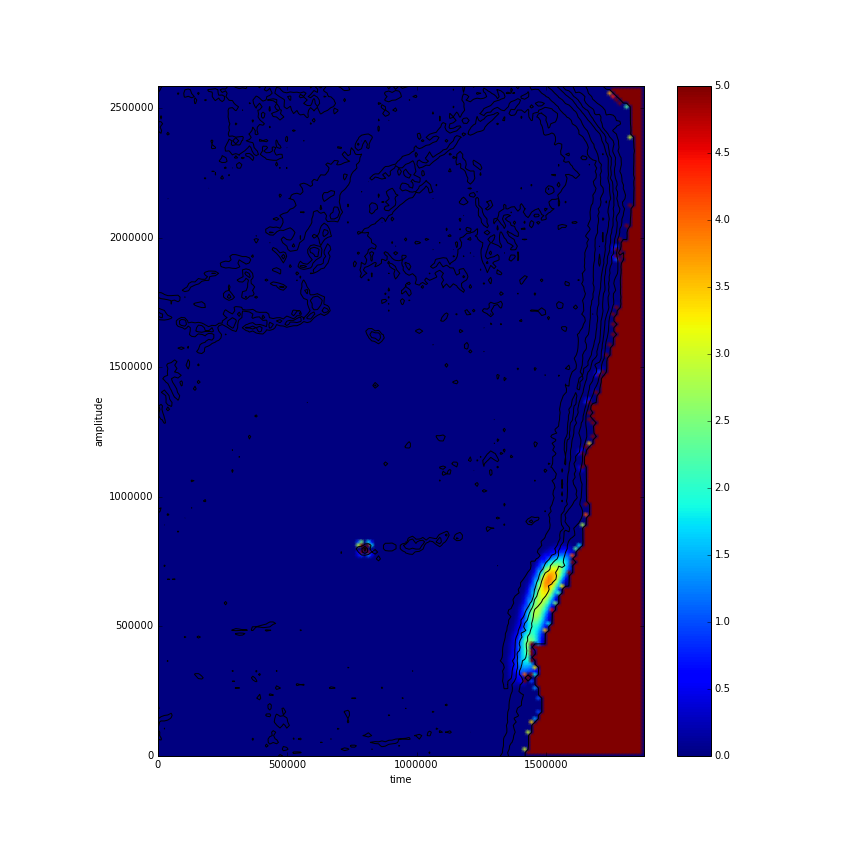
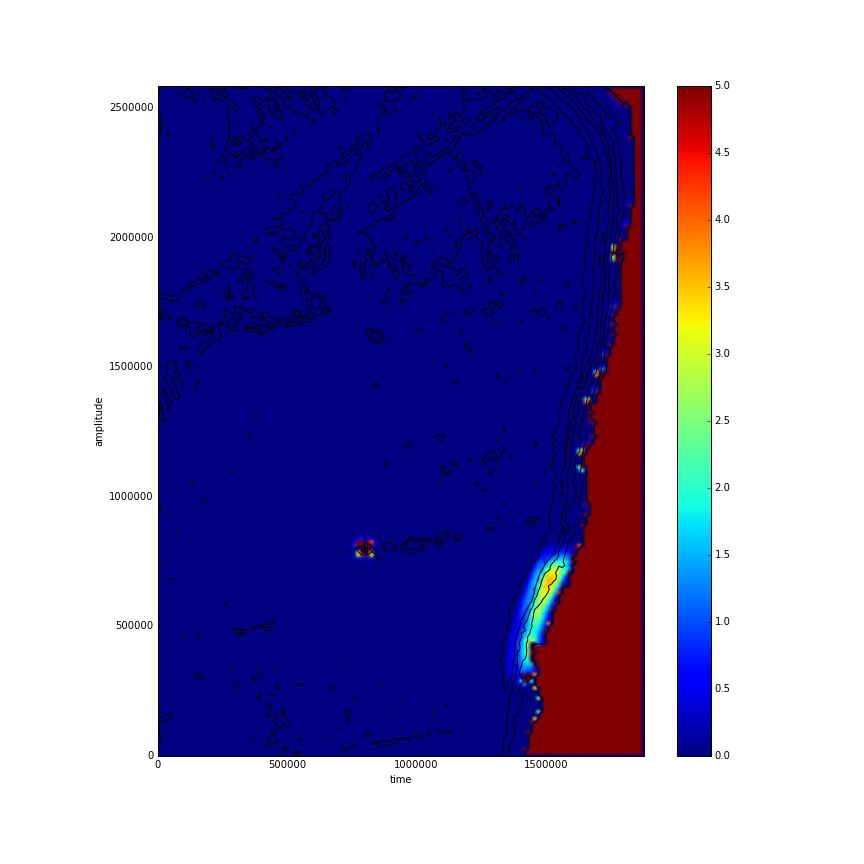
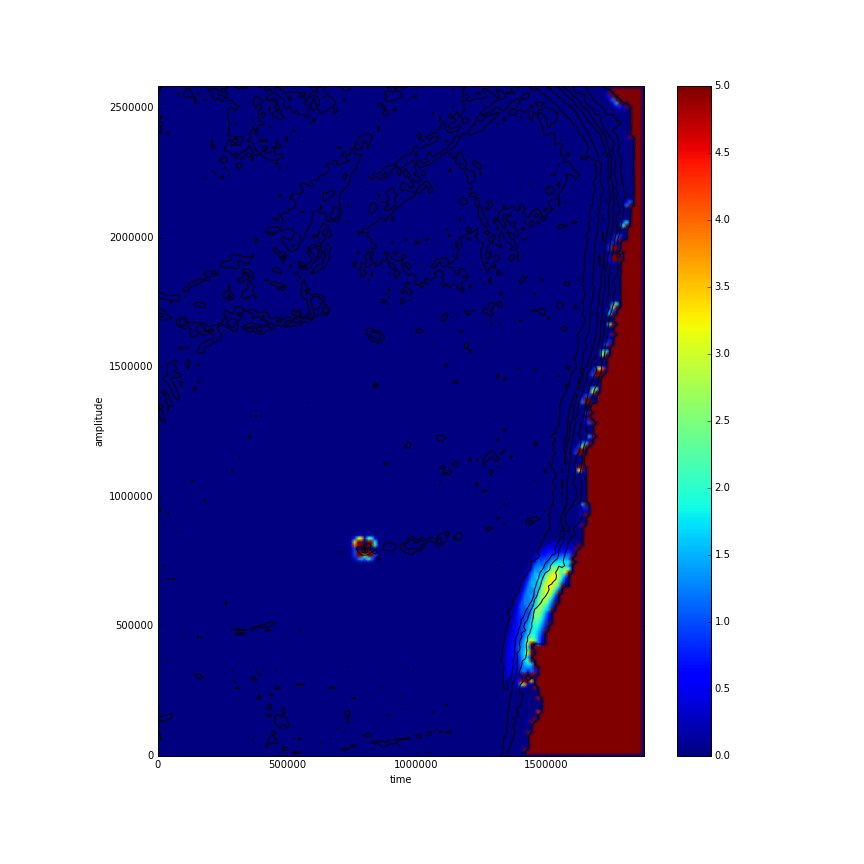
...
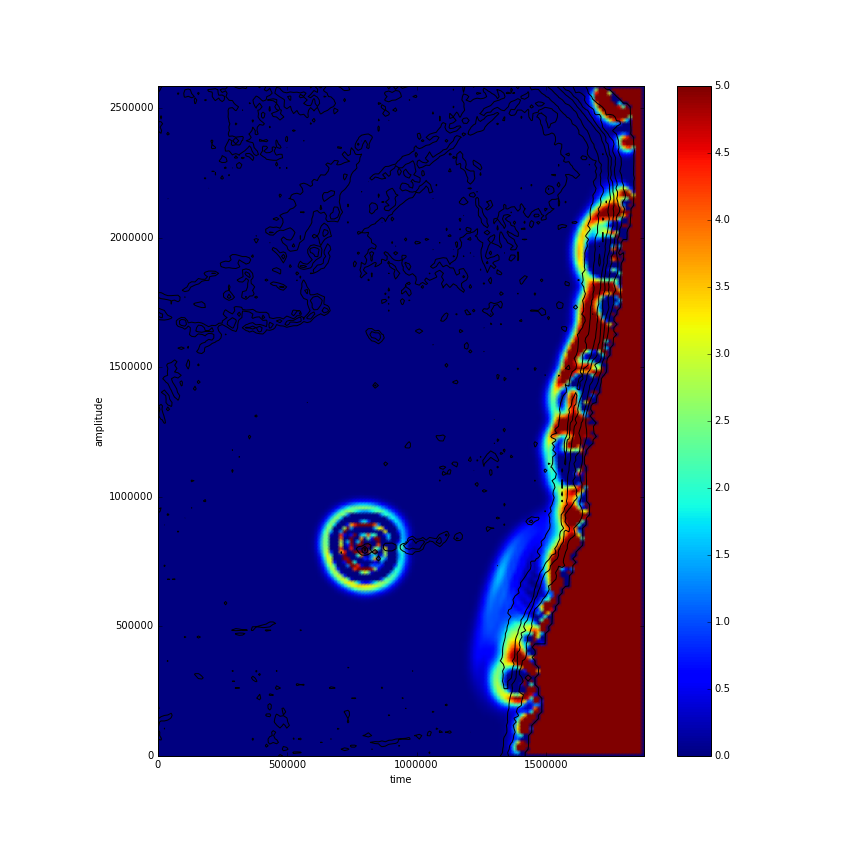
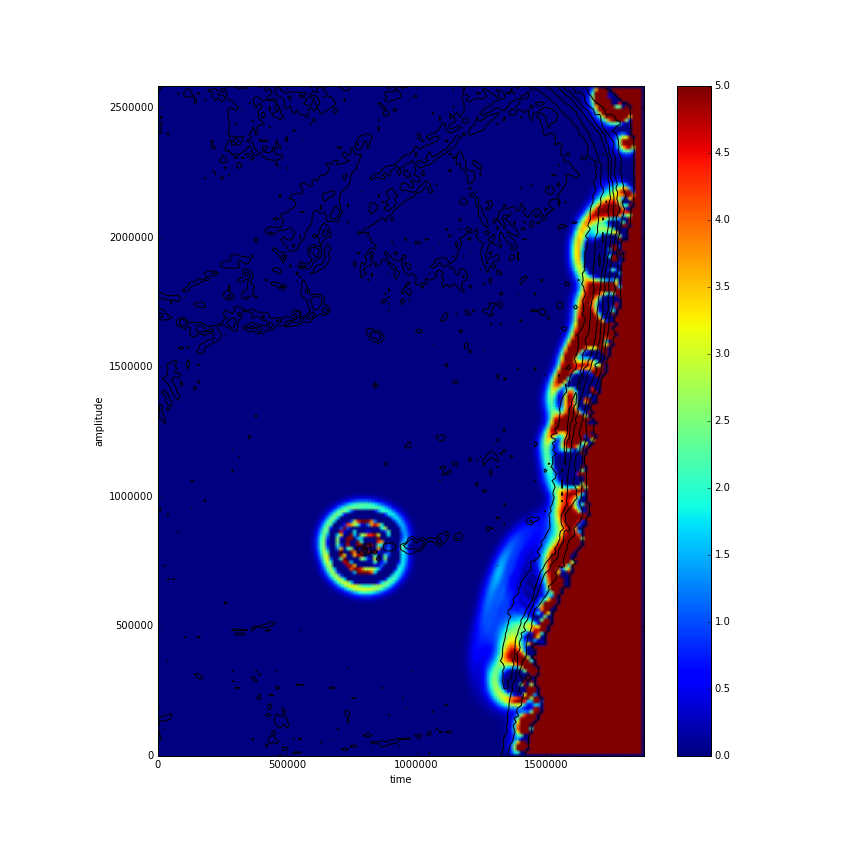
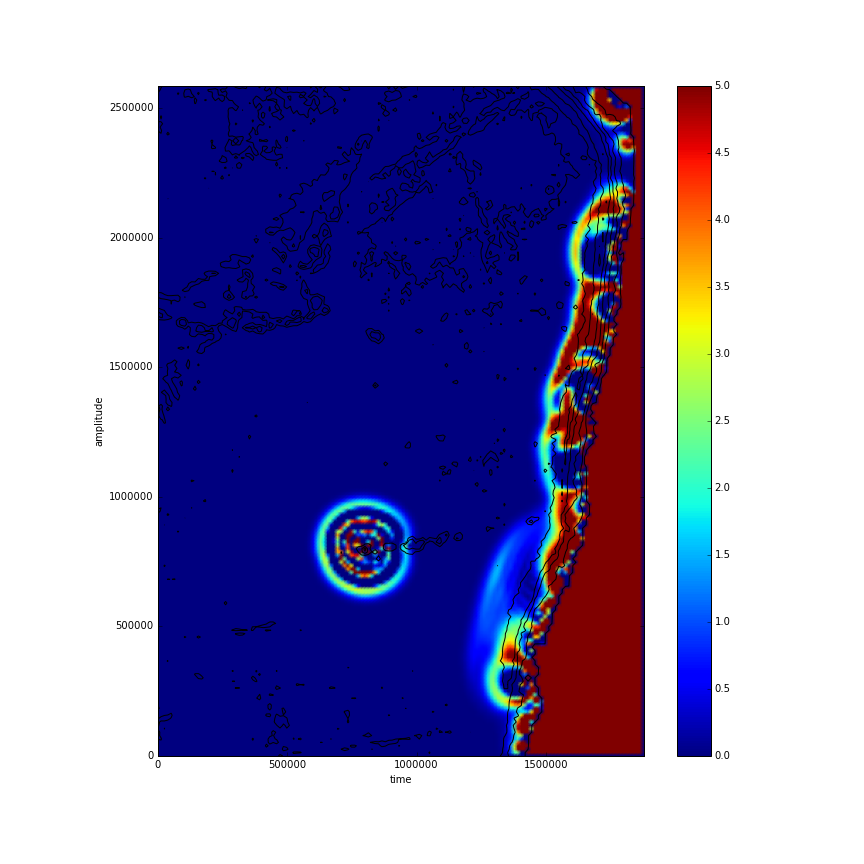
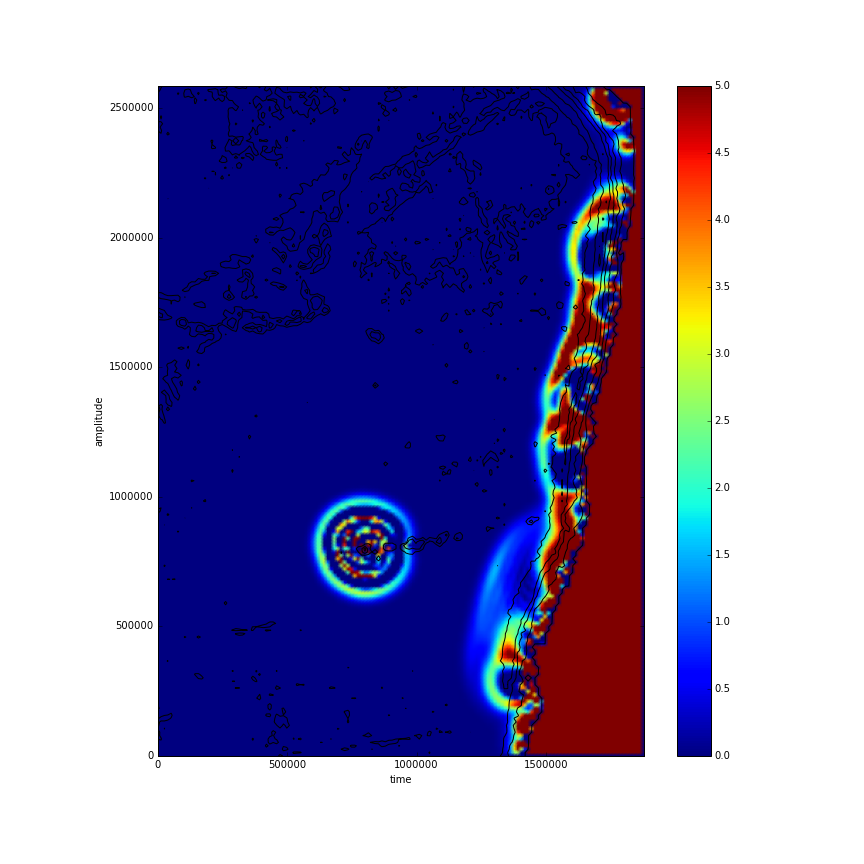
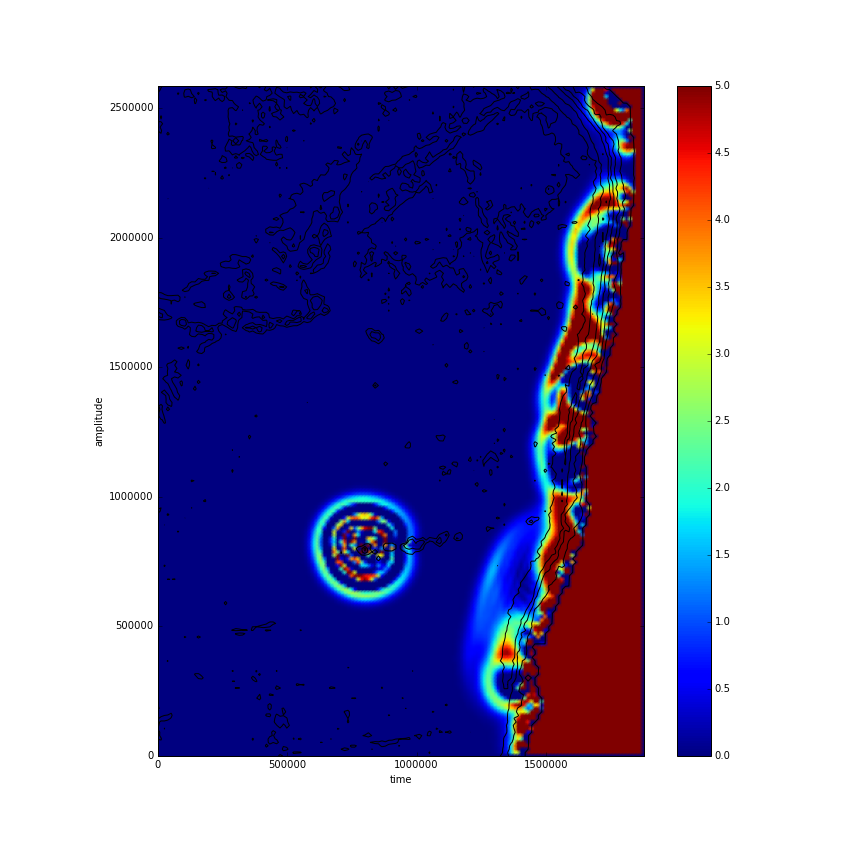

In [75]:
from matplotlib import animation
from JSAnimation import IPython_display

fig = plt.figure(figsize=(12,12))
ax2 = fig.add_subplot(111)
quad1 = ax2.pcolormesh(x,y,eta[0,:,:],shading='gouraud',vmax=5.)
ax2.contour(x,y,h,colors='k')

ax2.set_xlabel('time')
ax2.set_ylabel('amplitude')
# ax2.set_xlim(-10,5)
# ax2.set_ylim(-5,5)
cb2 = fig.colorbar(quad1,ax=ax2)
ax2.set_aspect('equal')
def init():
    quad1.set_array([])
    return quad1,


def animate(i):
    quad1.set_array(eta[i*2,:,:].ravel())
    return quad1,

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=25, interval=100)

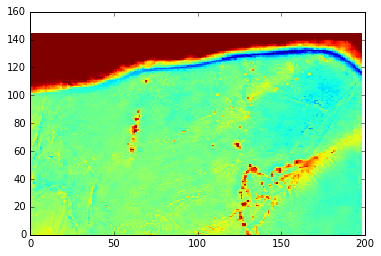

In [31]:
plt.pcolormesh(-h,vmax=0.)